<div align="center">

<h1 style="font-size: 36px;">👋 Система распознавания жестов - GestSpace 👋</h1>



<img src="https://img.shields.io/badge/embeddings-learned-blueviolet?style=for-the-badge&logo=vector" alt="Embeddings Badge" />
<img src="https://img.shields.io/badge/gestures-custom-green?style=for-the-badge&logo=handshake" alt="Gestures Badge" />
<img src="https://img.shields.io/badge/motion-metrics-critical?style=for-the-badge&logo=chart" alt="Motion Badge" />

</div>

---

## ✨ Что такое **GestSpace**?

**GestSpace** — это платформа для распознавания пользовательских жестов, построенная на идее обучения **эмбеддингов движений**. Вместо фиксированного набора классов мы создаем **векторное представление** для каждого жеста, позволяя пользователю **добавлять свои собственные**.

- 📏 Использует **triplet loss** для обучения пространства, где похожие жесты ближе
- 🧠 На выходе — **вектор движения** вместо жёсткой классификации
- 🔎 Использует **метрические алгоритмы** (например, KNN) для поиска ближайших жестов
- 🛠️ Позволяет пользователю **обучать новые жесты** за минуты, а не часы
- 💡 Идеально для динамических движений, которые меняются во времени

---

## 💭 Ключевая идея

> "Каждый жест — это точка в пространстве. **GestSpace** обучает нейросеть понимать, где именно."

---

## 📐 Пример: пользователь добавляет жест

1. Пользователь показывает жест 10 раз  
2. Получаем 10 последовательностей → 10 векторов  
3. Сохраняем как **кластер** жеста  
4. Во время работы: новое движение → эмбеддинг → ищем ближайший жест

---

## 🚀 Цель

Создать **гибкий и интуитивный** интерфейс взаимодействия с компьютером, где **движения становятся языком**.

---

# 🧭 Оглавление

- [Система распознавания жестов - GestSpace](#система-распознавания-жестов---gestspace)
  - [Что такое GestSpace?](#что-такое-gestspace)
  - [Ключевая идея](#ключевая-идея)
  - [Пример: пользователь добавляет жест](#пример-пользователь-добавляет-жест)
  - [Цель](#цель)
- [1. Imports](#1-imports)
- [2. Functions](#2-functions)
  - [2.1 Предобработка](#21-предобработка)
  - [2.2 Augmentation](#22-augmentation)
- [3. Обзор датасета](#3-обзор-датасета)
- [4. Архитектура сети](#4-архитектура-сети)
  - [4.1 Сеть: CNN + Transformer](#41-сеть-cnn--transformer)
  - [4.2 Triplet Loss](#42-triplet-loss)
- [5. Классы для работы с данными](#5-классы-для-работы-с-данными)
  - [5.1 Dataset](#51-dataset)
  - [5.2 Dataloader](#52-dataloader)
- [6. Обучение модели](#6-обучение-модели)
- [7. Оценка результатов](#7-оценка-результатов)
  - [7.1 TSNE Plot (2D)](#71-tsne-plot-2d)
  - [7.2 TSNE Plot (3D)](#72-tsne-plot-3d)
  - [7.3 PCA Plot](#73-pca-plot)
  - [7.4 Проверка на новых данных](#74-проверка-на-новых-данных)
* [8. Тест эмбеддингов для классификации](#8.Тест-эмбеддингов-для-классификации)

# 1.Imports

In [435]:
import torch 
import torch.nn as nn
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import random
import torch.utils.data as data
import torch.nn.functional as F
from tqdm import tqdm
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
import plotly.io as pio
pio.renderers.default = 'notebook'

%matplotlib inline

In [6]:
print(torch.__version__)
print("CUDA available:", torch.cuda.is_available())

2.7.0+cu118
CUDA available: True


# 2.Functions

In [7]:
def load_sequence_from_csv(filename="seq.csv"):
    """Загружает CSV и восстанавливает 3D-массив"""
    df = pd.read_csv(filename)
    num_frames = df.shape[0]  # Количество строк (кадров)
    num_points = df.shape[1] // 2  # Количество точек (по 2 координаты на точку)
    
    # Преобразуем обратно в (кадры, точки, координаты)
    seq = df.values.reshape(num_frames, num_points, 2)
    return seq

In [8]:
def animate_sequence(seq, text_str, xlim=(0, 1280), ylim=(720, 0), interval=150):
    %matplotlib inline

    fig, ax = plt.subplots()
    fig.patch.set_facecolor('#f0f0f0')  # Устанавливаем цвет фона графика
    ax.set_facecolor('#e6e6e6')  # Устанавливаем цвет фона осей

    # Настройка scatter plot с маркерами и цветом
    scat = ax.scatter(seq[0][:, 0], seq[0][:, 1], s=50, c='red', edgecolor='k', marker='o')

    
    connections = [[1, 5], [0, 1], [1, 2], [2, 3], [3, 4], [0, 5], [5, 6], [6, 7], [7, 8],
                   [9, 10], [10, 11], [11, 12], [13, 14], [14, 15], [15, 16], [13, 17],
                   [17, 18], [18, 19], [19, 20], [0, 17], [5, 9], [9, 13]]

    lines = []

    for connection in connections:
        line, = ax.plot([], [], color='#003399', linewidth=2)  # Линии с кастомным цветом и толщиной
        lines.append(line)

    # Добавим текстовое сообщение сверху
    text_label = ax.text(0.5, 1.05, text_str, transform=ax.transAxes, fontsize=12, ha='center', va='bottom', color='black')

    def init():
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        return [scat] + lines + [text_label]

    def update(frame):
        scat.set_offsets(seq[frame])
        for i, connection in enumerate(connections):
            x_data = [seq[frame][connection[0], 0], seq[frame][connection[1], 0]]
            y_data = [seq[frame][connection[0], 1], seq[frame][connection[1], 1]]
            lines[i].set_data(x_data, y_data)
        
        return [scat] + lines + [text_label]

    ani = FuncAnimation(fig, update, frames=len(seq), init_func=init, blit=True, interval=interval)

    return HTML(ani.to_jshtml())

# 2.1 Предобработка

In [11]:
def get_bbox(points):
    """
    По ключевым точкам строим координаты ограничивающей рамки в формате (x_min, y_min, x_max, y_max).

    :param points: Ключевые точки
    """
    scale_factor = 1.2    # Коэффициент растягивания рамки
    x_min, y_min = np.min(points[:, 0]), np.min(points[:, 1])
    x_max, y_max = np.max(points[:, 0]), np.max(points[:, 1])

    width = x_max - x_min
    height = y_max - y_min

    
    new_width = width * scale_factor
    new_height = height * scale_factor

    new_x_min = x_min - (new_width - width) / 2
    new_y_min = y_min - (new_height - height) / 2
    new_x_max = x_max + (new_width - width) / 2
    new_y_max = y_max + (new_height - height) / 2

    
    return np.array([new_x_min, new_y_min, new_x_max, new_y_max]).reshape(-1,2)

def dist(x0, y0, x1, y1):
    result = np.linalg.norm(np.array([x1, y1]) - np.array([x0, y0]))
    return result


def classification(fingers_cords, model):
    fingers_unif = prepare_for_model(fingers_cords)
    res = model(fingers_unif)

    return res

def prepare2(fingers_cords):
    fingers_rot = unificate_hand(fingers_cords)[0]  # Унифицируем ладонь
    fingers_rot = fingers_rot - fingers_cords[0]    # Переносим центр С.К. в (x0, y0)

    fingers_x = fingers_rot[:, 0]
    fingers_y = fingers_rot[:, 1]

    fingers_x = normalize(fingers_x)
    fingers_y = normalize(fingers_y)

    fingers_x = fingers_x[1:]
    fingers_y = fingers_y[1:]

    fingers_unif = (np.concatenate([fingers_x, fingers_y]).T)

    return fingers_unif

def prepare_for_model(fingers_cords):
    fingers_rot = unificate_hand(fingers_cords)[0]  # Унифицируем ладонь
    fingers_rot = fingers_rot - fingers_cords[0]    # Переносим центр С.К. в (x0, y0)

    fingers_x = fingers_rot[:, 0]
    fingers_y = fingers_rot[:, 1]

    fingers_x = normalize(fingers_x)
    fingers_y = normalize(fingers_y)

    fingers_x = fingers_x[1:]
    fingers_y = fingers_y[1:]

    fingers_unif = np.expand_dims(np.concatenate([fingers_x, fingers_y]).T, axis=0)

    return fingers_unif


def normalize(x):
    x1 = x / x.std()
    return x1

def unificate_hand(fingers_cords: np.array):    # Отзеркалена, повернута.
    mirror_flag = define_orientation(fingers_cords)  # Проверяем направленность ладони
    if mirror_flag == -1:
        fingers_cords = mirror_hand(fingers_cords)  # При необходимости отражаем координаты кисти

    alpha = calculate_angle(fingers_cords)  # Вычисляем угол наклона ладони

    center_x, center_y = fingers_cords[0]  # Сохраняем точку 0
    # Для корректного наклона руки относительно точки 0 нереносим центр С.К. в точку 0
    fingers_cords_transfered = transfer_fingers(fingers_cords, fingers_cords[0])

    # Применяем оператор поворота
    rotation_matrix = np.array([[np.cos(-alpha), -np.sin(-alpha)],
                                [np.sin(-alpha), np.cos(-alpha)]])

    fingers_rot = np.dot(fingers_cords_transfered, rotation_matrix)

    # Возвращаем центр С.К. назад
    fingers_rot += np.array([center_x, center_y])

    return fingers_rot.astype(int), alpha

def unificate_hand2(fingers_cords: np.array):    # Отзеркалена, повернута.
    mirror_flag = define_orientation(fingers_cords)  # Проверяем направленность ладони
    if mirror_flag == -1:
        fingers_cords = mirror_hand(fingers_cords)  # При необходимости отражаем координаты кисти

    alpha = calculate_angle(fingers_cords)  # Вычисляем угол наклона ладони

    center_x, center_y = fingers_cords[0]  # Сохраняем точку 0
    # Для корректного наклона руки относительно точки 0 нереносим центр С.К. в точку 0
    fingers_cords_transfered = transfer_fingers(fingers_cords, fingers_cords[0])

    # Применяем оператор поворота
    rotation_matrix = np.array([[np.cos(-alpha), -np.sin(-alpha)],
                                [np.sin(-alpha), np.cos(-alpha)]])

    fingers_rot = np.dot(fingers_cords_transfered, rotation_matrix)

    # Возвращаем центр С.К. назад
    fingers_rot += np.array([center_x, center_y])

    return fingers_rot.astype(int)


def calculate_angle(fingers_cords: np.array) -> float:  # Вычисление угла наклона ладони
    delta = fingers_cords[13] - fingers_cords[9]  # Координаты разности
    temp1 = delta[0]  # x-координата разности
    temp2 = np.linalg.norm(delta)  # длина вектора

    if temp2 == 0:  # Избегаем деления на ноль
        return 0

    angle = np.arccos(temp1 / temp2)  # Вычисляем угол
    orient = np.sign(fingers_cords[0][0] - fingers_cords[13][0])  # Определяем ориентацию наклона
    angle *= np.sign(orient)

    return angle


def define_orientation(fingers_cords: np.array) -> int:
    finger_0 = fingers_cords[0]
    finger_9 = fingers_cords[9]
    finger_13 = fingers_cords[13]

    # Вычисляем компоненты
    delta_x_9 = finger_9[0] - finger_0[0]
    delta_y_13 = finger_13[1] - finger_0[1]
    delta_y_9 = finger_9[1] - finger_0[1]
    delta_x_13 = finger_13[0] - finger_0[0]

    # Третья координата векторного произведения
    z_comp = delta_x_9 * delta_y_13 - delta_y_9 * delta_x_13

    return np.sign(z_comp)  # 1 - ладонь в камеру, -1 - ладонь в лицо


def mirror_hand(fingers_cords: np.array) -> np.array:
    symmerty_point = fingers_cords[0][0]

    mirrored_cord = fingers_cords.copy()

    mirrored_cord[1:, 0] += 2 * (symmerty_point - fingers_cords[1:, 0])

    return mirrored_cord


def transfer_fingers(fingers_cords: np.array, center: np.array) -> np.array:
    fingers_transfer = fingers_cords - center
    return fingers_transfer


def return_normalized_points(fingers_cords):
    fingers_x = fingers_cords[:, 0]
    fingers_y = fingers_cords[:, 1]

    fingers_x = (fingers_x - fingers_x.mean()) / fingers_x.std()
    fingers_y = (fingers_y - fingers_y.mean()) / fingers_y.std()

    fingers_norm = np.dstack((fingers_x, fingers_y))

    return fingers_norm[0]

def calculate_absangle(fingers_cords):
    mirror_flag = define_orientation(fingers_cords)
    if mirror_flag == -1:
        fingers_cords = mirror_hand(fingers_cords)

    temp1 = fingers_cords[13][0] - fingers_cords[9][0]
    temp2 = math.sqrt(
        math.pow((fingers_cords[13][1] - fingers_cords[9][1]), 2) + math.pow(
            (fingers_cords[13][0] - fingers_cords[9][0]), 2))

    angle = np.arccos(temp1 / temp2)
    orient = np.sign(fingers_cords[0][0] - fingers_cords[13][0])
    angle *= np.sign(orient)

    if mirror_flag == -1:
        angle *= mirror_flag

    return angle

def conversion_to_degrees(angle):
    angle_degrees = round((angle / math.pi * 180), 2)
    return angle_degrees

# 2.2.Augmentation

In [13]:
def stretch_y(frame, scale_y=1.5):
    frame_stretched = frame.copy()
    frame_stretched[:, 1] = frame[:, 1].mean() + (frame[:, 1] - frame[:, 1].mean()) * scale_y
    return frame_stretched

def stretch_x(frame, scale_x=1.5):
    frame_stretched = frame.copy()
    frame_stretched[:, 0] = frame[:, 0].mean() + (frame[:, 0] - frame[:, 0].mean()) * scale_x
    return frame_stretched

def perspective_transform(frame, perspective_center, coef=100):
    frame_transformed = frame.copy()
    direction = frame - perspective_center  # Вектор направления
    direction_norm = np.linalg.norm(direction, axis=-1, keepdims=True)  # Длина вектора
    
    # Избегаем деления на ноль
    direction_norm = np.where(direction_norm == 0, 1, direction_norm)
    # Нормализуем и масштабируем
    frame_transformed += coef * direction / direction_norm  

    return frame_transformed

def add_jitter(frame, noise_level=1):
    noise = np.random.uniform(-noise_level, noise_level, frame.shape)
    return frame + noise

def non_linear_warp(seq, strength=0.2):
    seq_len = seq.shape[0]
    
    # Генерируем случайную нелинейную кривую для каждого кадра
    warp_x = (np.sin(np.linspace(0, np.pi * 2, seq_len)) + np.random.uniform(-1, 1, seq_len)) * strength
    warp_y = (np.cos(np.linspace(0, np.pi * 2, seq_len)) + np.random.uniform(-1, 1, seq_len)) * strength
    
    # Создаем копию, чтобы не изменять входные данные
    seq_warped = np.copy(seq)
    
    # Применяем искажение только к ненулевым точкам
    mask = (seq != 0)
    seq_warped[:, :, 0] += warp_x[:, np.newaxis] * mask[:, :, 0]
    seq_warped[:, :, 1] += warp_y[:, np.newaxis] * mask[:, :, 1]
    
    return seq_warped

In [48]:
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def apply_paddings(seq, max_len=20):
    if seq.shape[0] < max_len:
        padding = np.zeros((max_len - seq.shape[0], seq.shape[1],seq.shape[2])) 
        seq = np.vstack([seq, padding])
    else:
        seq = seq[-max_len:]

    return seq

def animate_multiple_sequences(sequences, text_strs, xlim=(0, 1280), ylim=(720, 0), interval=150, n_rows=2, n_cols=3, fig_size=(15,10)):
    # Создаем фигуру и оси для 6 графиков
    fig, axes = plt.subplots(n_rows, n_cols, figsize=fig_size)
    fig.patch.set_facecolor('#f0f0f0')  # Устанавливаем цвет фона графика
    
    # Список для хранения объектов анимации
    scatters = []
    lines = []
    text_labels = []
    
    connections = [[1, 5], [0, 1], [1, 2], [2, 3], [3, 4], [0, 5], [5, 6], [6, 7], [7, 8],
                   [9, 10], [10, 11], [11, 12], [13, 14], [14, 15], [15, 16], [13, 17],
                   [17, 18], [18, 19], [19, 20], [0, 17], [5, 9], [9, 13]]

    for i, ax in enumerate(axes.flatten()):  # Создаем анимацию для каждого графика
        ax.set_facecolor('#e6e6e6')  # Цвет фона осей
        # Убедимся, что данные содержат только 2 колонки (x, y)
        scat = ax.scatter(sequences[i][0][:, 0], sequences[i][0][:, 1], s=50, c='red', edgecolor='k', marker='o')
        lines_i = []

        for connection in connections:
            line, = ax.plot([], [], color='#003399', linewidth=2)
            lines_i.append(line)

        # Добавим уникальное текстовое сообщение для каждого графика
        text_label = ax.text(0.5, 1.05, text_strs[i], transform=ax.transAxes, fontsize=12, ha='center', va='bottom', color='black')

        scatters.append(scat)
        lines.append(lines_i)
        text_labels.append(text_label)

        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

    def init():
        return [scat for scat in scatters] + [line for lines_i in lines for line in lines_i] + text_labels

    def update(frame):
        for i, ax in enumerate(axes.flatten()):
            scatters[i].set_offsets(sequences[i][frame][:, :2])  # Передаем только первые две координаты (x, y)
            for j, connection in enumerate(connections):
                x_data = [sequences[i][frame][connection[0], 0], sequences[i][frame][connection[1], 0]]
                y_data = [sequences[i][frame][connection[0], 1], sequences[i][frame][connection[1], 1]]
                lines[i][j].set_data(x_data, y_data)
        
        return [scat for scat in scatters] + [line for lines_i in lines for line in lines_i] + text_labels

    ani = FuncAnimation(fig, update, frames=len(sequences[0]), init_func=init, blit=True, interval=interval)

    return HTML(ani.to_jshtml())

# 3. Обзор датасета

In [80]:
gestures = [
    ("lbm+", "Прижимание большого пальца к ладони при вытянутом указательном пальце (позитивная фаза)"),
    ("lbm-", "Разжимание большого пальца от ладони при вытянутом указательном пальце (негативная фаза)"),
    ("2lbm+", "Прижимание большого пальца к ладони при вытянутых указательном и среднем пальцах (позитивная фаза)"),
    ("2lmb-", "Разжимание большого пальца от ладони при вытянутых указательном и среднем пальцах (негативная фаза)"),
    ("rbm+", "Вытягивание мизинца при вытянутых указательном и большом пальцах (позитивная фаза)"),
    ("rbm-", "Прижимание мизинца при вытянутых указательном и большом пальцах (негативная фаза)"),
    ("left_swing", "Взмах рукой влево"),
    ("right_swing", "Взмах рукой вправо"),
    ("fist_down", "Переход от сжатого кулака к положению, в котором кулак направлен вниз"),
    ("fist_up", "Переход от положения кулака вниз к сжатию кулака"),
    ("fist_2_palm", "Переход от сжатого кулака к открытому положению ладони"),
    ("palm_2_fist", "Переход от открытой ладони к сжатию кулака"),
    ("attract", "Открытая ладонь трансформируется в итальянский жест, направленный в камеру"),
    ("reverse_attract", "Негативная фаза предыдущего жеста"),
    ("gun_down", "Жест с имитацией пистолета, который опускается вниз"),
    ("gun_up", "Жест с имитацией пистолета, направляющийся вверх"),
    ("carousel", "Жест, при котором пальцы поочередно складываются, создавая движение"),
    ("slider", "Жест слайдера, при котором два пальца — указательный и средний"),

    # Статичные жесты
    ("s_fist", "Кулак сжат, когда все пальцы рук собраны в кулак"),
    ("s_1fingerup", "Указательный палец поднят вверх"),
    ("s_2fingerup", "Указательный и средний пальцы подняты вверх, остальные прижаты к ладони"),
    ("s_pinch", "Жест щипка, когда указательный и большой пальцы сомкнуты"),
    ("s_ok", "Жест 'ок', когда большой и указательный палец соединяются в круг"),
    ("s_like", "Жест 'лайк', когда большой палец поднят вверх"),
    ("s_call", "Жест 'звонок', когда большой палец и мизинец подняты"),
    ("s_openpalm", "Открытая ладонь, когда пальцы распрямлены"),
    ("s_grab", "Жест 'тумблер', имитирующий захват или удержание")
]

# Создание DataFrame
df = pd.DataFrame(gestures, columns=["Жест", "Описание"])

# Отображение без индекса
from IPython.display import display, HTML
display(HTML(df.to_html(index=False)))

Жест,Описание
lbm+,Прижимание большого пальца к ладони при вытянутом указательном пальце (позитивная фаза)
lbm-,Разжимание большого пальца от ладони при вытянутом указательном пальце (негативная фаза)
2lbm+,Прижимание большого пальца к ладони при вытянутых указательном и среднем пальцах (позитивная фаза)
2lmb-,Разжимание большого пальца от ладони при вытянутых указательном и среднем пальцах (негативная фаза)
rbm+,Вытягивание мизинца при вытянутых указательном и большом пальцах (позитивная фаза)
rbm-,Прижимание мизинца при вытянутых указательном и большом пальцах (негативная фаза)
left_swing,Взмах рукой влево
right_swing,Взмах рукой вправо
fist_down,"Переход от сжатого кулака к положению, в котором кулак направлен вниз"
fist_up,Переход от положения кулака вниз к сжатию кулака


In [51]:
folder = 'GestureData'
gestures = random.sample(os.listdir(folder), 6)

samples = []

for gesture in gestures:
    filename = random.choice(os.listdir(os.path.join(folder, gesture)))
    samples.append(os.path.join(folder, gesture, filename))

sequences = [apply_paddings(load_sequence_from_csv(sample), max_len=50) for sample in samples] 

animate_multiple_sequences(sequences, samples)

In [187]:
sequences[0].shape

(50, 21, 2)

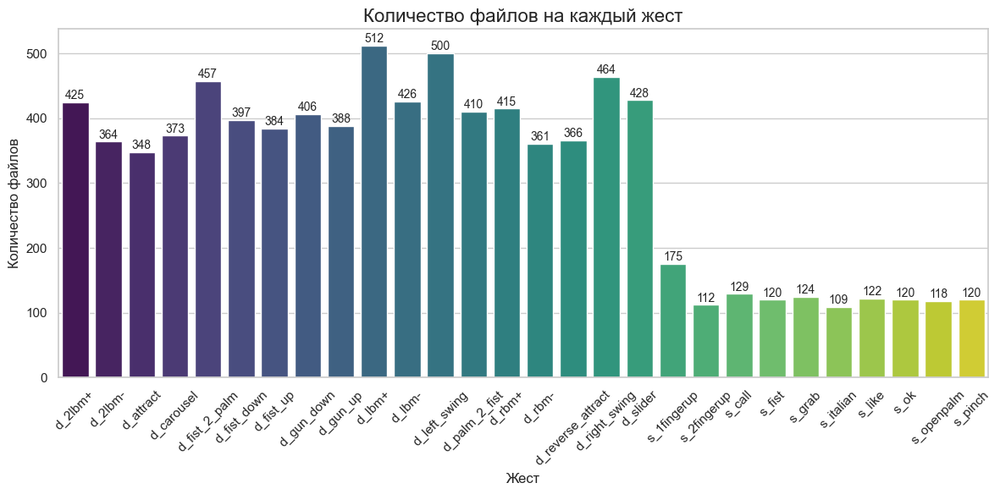

In [81]:
gestures = [f for f in os.listdir(folder) if not f.startswith('unk')]

counts = [len(os.listdir(os.path.join(folder, gesture))) for gesture in gestures]

df = pd.DataFrame({'Gesture': gestures, 'Count': counts})

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))

barplot = sns.barplot(data=df, x='Gesture', y='Count', hue='Gesture', palette='viridis', legend=False)

for i, row in df.iterrows():
    barplot.text(i, row['Count'] + 1, str(row['Count']), ha='center', va='bottom', fontsize=10)

plt.title("Количество файлов на каждый жест", fontsize=16)
plt.xlabel("Жест", fontsize=12)
plt.ylabel("Количество файлов", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

# 4. DataGenerator

### Тройная функция потерь (Triplet Loss)


Тройная функция потерь используется для обучения моделей с целью построения эмбеддингов, в которых положительные пары находятся ближе друг к другу, чем отрицательные, с заданным запасом (margin).

Обозначим:  
- $f(a)$ — эмбеддинг якорного образца (anchor),  
- $f(p)$ — эмбеддинг положительного образца (positive),  
- $f(n)$ — эмбеддинг отрицательного образца (negative),  
- $\alpha$ — параметр margin (запас).

Формула Triplet Loss:

$$
\mathcal{L} = \max \left( \| f(a) - f(p) \|_2^2 - \| f(a) - f(n) \|_2^2 + \alpha, \; 0 \right)
$$

Иными словами, функция потерь заставляет расстояние между якорем и отрицательным образцом быть больше, чем расстояние между якорем и положительным образцом минимум на $\alpha$.

Подробнее можно прочитать в оригинальной статье: 
[FaceNet: A Unified Embedding for Face Recognition and Clustering (Schroff et al., 2015)](https://arxiv.org/abs/1503.03832)

### Формат данных для обучения с тройной функцией потерь

Наш датасет должен возвращать **тройку образцов**:  
- **Anchor (якорь)** — эталонный пример жеста,  
- **Positive (положительный)** — пример того же класса, что и якорь,  
- **Negative (отрицательный)** — пример другого класса.

Эта тройка используется для обучения энкодера, чтобы он минимизировал расстояние между якорем и положительным примером и максимизировал — с отрицательным. Выбирать positive и negative будем случайным образом.

In [207]:
hard_example = {
    'd_2lbm+': ['d_2lbm-', 'd_lbm+', 'd_rbm+'],
    'd_2lbm-': ['d_2lbm+', 'd_lbm+', 'd_lbm-'],
    'd_lbm+': ['d_lbm-'],
    'd_lbm-': ['d_lbm+', 'd_rbm-'],
    'd_rbm+': ['d_rbm-'],
    'd_rbm-': ['d_rbm+'],
    'd_left_swing': ['d_right_swing'],
    'd_right_swing': ['d_left_swing'],
    'd_gun_down': ['d_gun_up', 'd_slider'],
    'd_gun_up': ['d_gun_down', 'd_slider'],
    'd_palm_2_fist': ['d_carousel', 'd_fist_2_palm'],
    'd_fist_2_palm': ['d_carousel', 'd_palm_2_fist'],
    'd_reverse_attract': ['d_fist_2_palm'],
    'd_carousel': ['d_palm_2_fist', 'd_fist_2_palm', 'd_palm_2_fist'],
    'd_slider': ['d_gun_down', 'd_gun_up'],
    'd_gun_down': ['d_slider'],
    's_1fingerup': ['d_lbm+'],
    's_2fingerup': ['d_2lbm+'],
    's_fist': ['d_fist_down'],
    's_grab': ['s_italian', 's_like'],
    's_like': ['s_grab', 's_ok'],
    's_pinch': ['s_1fingerup'],
    's_fist': ['s_pinch'],
    's_italian': ['s_ok', 's_like']
}

In [427]:
class PrepateData:
    def __init__(self):
        pass

    def __call__(self, seq, max_len=50):
        # 1. Вычисляем bbox (до нормализации keypoints)
        bbox_seq = np.array([get_bbox(frame) for frame in seq])  # (LEN, 2, 2)
        bbox_seq = bbox_seq.reshape(-1, 4)  # Приводим к (LEN, 4)

        # 2. Нормируем bbox 
        bbox_seq[:, [0, 2]] /= 1280  # x_min и x_max
        bbox_seq[:, [1, 3]] /= 720  # y_min и y_max

        # 3. Вычисляем угол
        angles_seq = np.array([calculate_absangle(frame) for frame in seq])  # (LEN,)
        angles_seq = angles_seq.reshape(-1, 1)  # Приводим к (LEN, 1)

        # 4. Нормализуем координаты
        seq = np.array([return_normalized_points(x) for x in seq])

        seq = seq.reshape(seq.shape[0], -1)  
        seq = np.concatenate([seq, bbox_seq, angles_seq], axis=-1)  
        
        if seq.shape[0] < max_len:
            padding = np.zeros((max_len - seq.shape[0], seq.shape[1]))
            seq = np.vstack([seq, padding])
        else:
            seq = seq[-max_len:]
            
        return seq

class GestureDataset(data.Dataset):
    def __init__(self, folder, transform, return_unk = False):
        self.folder = folder
        self.transform = transform
        self.return_unk = return_unk
        if self.return_unk:
            gestures = [f for f in os.listdir(self.folder) if f.startswith('s_') or f.startswith('d_') or f.startswith('unk_')]
        else:
            gestures = [f for f in os.listdir(self.folder) if f.startswith('s_') or f.startswith('d_')]
        self.data = {}
        
        for gesture in gestures:
            gesture_path = os.path.join(self.folder, gesture)
            files = [os.path.join(gesture_path, f) for f in os.listdir(gesture_path) if f.endswith('.csv')]
            self.data[gesture] = files

        self.all_samples = []
        for gesture, files in self.data.items():
            for f in files:
                self.all_samples.append((gesture, f))

        self.gestures = list(self.data.keys())

        self.static_gestures = [g for g in gestures if g.startswith('s_')]
        self.dynamic_gestures = [g for g in gestures if g.startswith('d_')]

    @staticmethod
    def load_sequence_from_csv(filename="seq.csv"):
        """Загружает CSV и восстанавливает 3D-массив"""
        df = pd.read_csv(filename)
        num_frames = df.shape[0]  # Количество строк (кадров)
        num_points = df.shape[1] // 2  # Количество точек (по 2 координаты на точку)
        
        # Преобразуем обратно в (кадры, точки, координаты)
        seq = df.values.reshape(num_frames, num_points, 2)
        return seq
        
    def __getitem__(self, idx):
        anchor_class, anchor_path = self.all_samples[idx]

        positive_path = anchor_path
        while positive_path == anchor_path:
            positive_path = random.choice(self.data[anchor_class])

        negative_class = anchor_class
        n_roll = random.random()
        # В 20% случаев выбираем статичный жест.
        if n_roll < 0.2 and len(self.static_gestures) > 0:
            negative_class_candidates = [g for g in self.static_gestures if g != anchor_class]
            if len(negative_class_candidates) > 0:
                negative_class = random.choice(negative_class_candidates)
            else:
                pass
                
        # В 30% случаев выбираем "hard" пример.
        if 0.2 <= n_roll < 0.5 and anchor_class in hard_example and len(hard_example[anchor_class]) > 0:
            hard_candidate = hard_example[anchor_class]
            if len(hard_candidate) >= 0:
                negative_class = random.choice(hard_candidate)
            else:
                pass
            
        # В остальных случаях выбираем случайный класс
        else:
            if negative_class == anchor_class:
                while negative_class == anchor_class:
                    negative_class = random.choice(self.gestures)

        
        negative_path = random.choice(self.data[negative_class])

        ancor_data = self.load_sequence_from_csv(anchor_path)
        positive_data = self.load_sequence_from_csv(positive_path)
        negative_data = self.load_sequence_from_csv(negative_path)

        if self.transform is not None:
            ancor_data = torch.tensor(self.transform(ancor_data), dtype=torch.float32)
            positive_data = torch.tensor(self.transform(positive_data), dtype=torch.float32)
            negative_data = torch.tensor(self.transform(negative_data), dtype=torch.float32)
            
        return (anchor_class, ancor_data), (anchor_class, positive_data), (negative_class, negative_data)
        
    def __len__(self):
        return len(self.all_samples)

In [298]:
ds = GestureDataset('GestureData', transform=None)
print(f"Элементов в обучающей выборке: {len(ds)}")

Элементов в обучающей выборке: 8672


In [241]:
(anc_class1, anc_data1), (pos_class1, pos_data1), (neg_class1, neg_data1) =  ds[0]
(anc_class2, anc_data2), (pos_class2, pos_data2), (neg_class2, neg_data2) =  ds[1500]

sequences = [apply_paddings(sample, max_len=20) for sample in [anc_data1, pos_data1, neg_data1, anc_data2, pos_data2, neg_data2]] 
labels = [anc_class1, pos_class1, neg_class1, anc_class2, pos_class2, neg_class2]

animate_multiple_sequences(sequences, labels)

Теперь наша задача — научить модель распознавать сходства и различия между жестами.  
Мы используем тройки примеров: `anchor`, `positive` (жест того же класса) и `negative` (жест другого класса).  
Модель должна отображать их в такое пространство, где жесты одного класса находятся ближе друг к другу,  
а жесты разных классов — дальше друг от друга.

Это достигается с помощью **Triplet Loss**, которая минимизирует расстояние между `anchor` и `positive`,  
и одновременно максимизирует расстояние до `negative`, соблюдая зазор (margin) $\alpha$:

# 5.Модель-энкодер

In [300]:
class Attention(nn.Module):
    def __init__(self, lstm_hidden_size):
        super().__init__()

    def forward(self, lstm_outputs, last_hidden, mask=None):
        last_hidden = last_hidden.unsqueeze(2)
        scores = torch.bmm(lstm_outputs, last_hidden).squeeze(2)

        if mask is not None:
            scores = scores.masked_fill(~mask, float('-inf')) # маскируем паддинги
        
        weights = F.softmax(scores, dim=1) # (batch_size, seq_len)
        weighted_sum = torch.bmm(weights.unsqueeze(1), lstm_outputs).squeeze(1)  # (batch_size, hidden_size)
        return weighted_sum, weights
        
class LSTMEncoder(nn.Module):
    def __init__(self, input_size=47, hidden_size=32, embedding_size=8, num_layers=1):
        super().__init__()
        self.lstm = nn.LSTM(input_size = input_size,
                           hidden_size = hidden_size,
                            num_layers = num_layers,
                            batch_first = True,
                            bidirectional = False)
        self.embedding_size = embedding_size
        self.hidden_size = hidden_size
    
        lstm_output_size = hidden_size 
        self.attention = Attention(self.hidden_size)
        self.fc = nn.Linear(lstm_output_size, embedding_size)

    def forward(self, x):
        # x: [batch_size, seq_len, input_size]
        mask = (x.abs().sum(dim=2) != 0)
        # Создаём маску: True — валидные шаги (не все нули), False — паддинг
        out, (h_n, c_n) = self.lstm(x)
        # output: [batch_size, seq_len, hidden_size]
        # h_n: (num_layers * num_directions, batch_size, hidden_size)
        # c_n: (num_layers * num_directions, batch_size, hidden_size)
        last_hidden = h_n[-1]
        # last_hidden: (batch_size, hidden_size)
        attn_output, _ = self.attention(out, last_hidden, mask)
        # attn_output: (batch_size, hidden_size)
        # attn_weights: (batch_size, seq_len)
        
        embedding = self.fc(attn_output)  
        # embedding: (batch_size, embedding_size)

        return embedding

In [295]:
model = LSTMEncoder()
ds = GestureDataset('GestureData', transform=PrepateData())
inp = ds[0]
model(torch.unsqueeze(inp[0][1], 0))

tensor([[-0.2081, -0.1041,  0.0898,  0.0292, -0.2159,  0.1394,  0.0110, -0.1166]],
       grad_fn=<AddmmBackward0>)

# 6. Обучение модели

In [305]:
train_data = GestureDataset('GestureData', transform=PrepateData())
train_loader = data.DataLoader(train_data, batch_size= 32, shuffle=True, drop_last = True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = LSTMEncoder().to(device)

triplet_loss = nn.TripletMarginLoss(margin=0.4)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

train_losses = []  # Для сохранения среднего лосса на каждой эпохе
batch_losses = []   # Для сохранения лосса на каждом батче (если нужна детальная визуализация)

num_epochs = 10
model.train()

for epoch in range(num_epochs):
    epoch_loss = 0.0
    batch_loss_buffer = []  # Для расчета среднего лосса в tqdm
    
    # Инициализация progress bar с дополнительной информацией
    loop = tqdm(
        train_loader, 
        desc=f"Epoch {epoch+1}/{num_epochs}",
        bar_format="{l_bar}{bar:20}{r_bar}",
        leave=True  # Оставляем прогресс после завершения эпохи
    )
    
    for batch_idx, triplets in enumerate(loop):
        (_, anchor), (_, positive), (_, negative) = triplets
        anchor = anchor.to(device)
        positive = positive.to(device)
        negative = negative.to(device)

        optimizer.zero_grad()
        anchor_emb = model(anchor)
        positive_emb = model(positive)
        negative_emb = model(negative)
        loss = triplet_loss(anchor_emb, positive_emb, negative_emb)
        loss.backward()
        optimizer.step()

        # Сохраняем значения для логирования
        current_loss = loss.item()
        epoch_loss += current_loss
        batch_losses.append(current_loss)  # Для детального анализа
        batch_loss_buffer.append(current_loss)
        
        # Обновляем progress bar каждые 10 батчей (или как вам удобно)
        if batch_idx % 10 == 0:
            avg_loss = sum(batch_loss_buffer) / len(batch_loss_buffer)
            loop.set_postfix({
                'batch_loss': f'{current_loss:.4f}',
                'avg_loss': f'{avg_loss:.4f}',
                'lr': f'{optimizer.param_groups[0]["lr"]:.2e}'
            })
            batch_loss_buffer = []  # Сброс буфера
    
    # После эпохи сохраняем средний лосс
    avg_epoch_loss = epoch_loss / len(train_loader)
    train_losses.append(avg_epoch_loss)
    
    # Выводим информацию о завершении эпохи
    tqdm.write(f"Epoch {epoch+1} completed. Avg loss: {avg_epoch_loss:.4f}")

Epoch 1/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.46it/s, batch_loss=0.0779, avg_loss=0.0490, lr=1.00e-03


Epoch 1 completed. Avg loss: 0.0824


Epoch 2/10: 100%|████████████████████| 271/271 [01:16<00:00,  3.52it/s, batch_loss=0.0037, avg_loss=0.0208, lr=1.00e-03


Epoch 2 completed. Avg loss: 0.0331


Epoch 3/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.45it/s, batch_loss=0.0107, avg_loss=0.0280, lr=1.00e-03


Epoch 3 completed. Avg loss: 0.0187


Epoch 4/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.47it/s, batch_loss=0.0156, avg_loss=0.0136, lr=1.00e-03


Epoch 4 completed. Avg loss: 0.0130


Epoch 5/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.47it/s, batch_loss=0.0239, avg_loss=0.0223, lr=1.00e-03


Epoch 5 completed. Avg loss: 0.0123


Epoch 6/10: 100%|████████████████████| 271/271 [01:17<00:00,  3.48it/s, batch_loss=0.0111, avg_loss=0.0132, lr=1.00e-03


Epoch 6 completed. Avg loss: 0.0100


Epoch 7/10: 100%|████████████████████| 271/271 [01:17<00:00,  3.48it/s, batch_loss=0.0275, avg_loss=0.0106, lr=1.00e-03


Epoch 7 completed. Avg loss: 0.0095


Epoch 8/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.44it/s, batch_loss=0.0311, avg_loss=0.0077, lr=1.00e-03


Epoch 8 completed. Avg loss: 0.0067


Epoch 9/10: 100%|████████████████████| 271/271 [01:18<00:00,  3.47it/s, batch_loss=0.0000, avg_loss=0.0079, lr=1.00e-03


Epoch 9 completed. Avg loss: 0.0074


Epoch 10/10: 100%|████████████████████| 271/271 [01:19<00:00,  3.41it/s, batch_loss=0.0000, avg_loss=0.0011, lr=1.00e-0

Epoch 10 completed. Avg loss: 0.0059


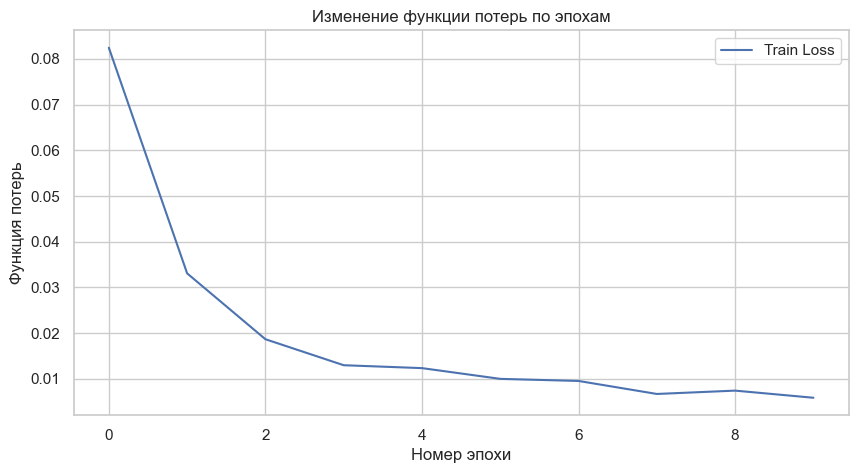

In [308]:
# Визуализация после обучения
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.xlabel('Номер эпохи')
plt.ylabel('Функция потерь')
plt.title('Изменение функции потерь по эпохам')
plt.legend()
plt.savefig('training_loss_TORCH.png')
plt.show()

#### Сохраняем и пробуем загрузить модель

In [310]:
torch.save(model.state_dict(), 'torch_GestureModel.pth')

In [430]:
model = LSTMEncoder()  # создаёшь модель той же архитектуры
model.load_state_dict(torch.load('torch_GestureModel.pth'))
model.eval()  # переключить в режим оценки (если нужно)

LSTMEncoder(
  (lstm): LSTM(47, 32, batch_first=True)
  (attention): Attention()
  (fc): Linear(in_features=32, out_features=8, bias=True)
)

# 7. Оценка качества эмбеддингов

In [325]:
model.eval()
embeddings_list = []
labels_list = []

with torch.no_grad():
    for gesture, _, _ in tqdm(train_data, desc="Computing embeddings"):
        label = gesture[0]               # метка
        data_tensor = gesture[1].unsqueeze(0).to(device)  # вход, batch dim, на устройство

        emb = model(data_tensor)         # (1, embedding_size)
        emb = emb.squeeze(0).cpu().numpy()  # убрать batch dim, в numpy

        embeddings_list.append(emb)
        labels_list.append(label)

df = pd.DataFrame(embeddings_list)
df['label'] = labels_list

print(df.head())

Computing embeddings: 100%|████████████████████████████████████████████████████████| 8672/8672 [01:38<00:00, 87.63it/s]

          0         1         2         3         4         5         6  \
0  1.973583 -0.912801 -0.957345  1.054387  0.883664 -0.106586 -0.873692   
1  2.031682 -0.925653 -0.996099  1.124175  0.862244 -0.072461 -0.973680   
2  2.014877 -0.920548 -0.980961  1.091802  0.858656 -0.064850 -0.961535   
3  2.003350 -0.873479 -0.946355  1.062075  0.881240 -0.112662 -0.900325   
4  1.933208 -0.877374 -0.887869  0.914603  0.830096 -0.039343 -0.838046   

          7    label  
0 -0.359679  d_2lbm+  
1 -0.356090  d_2lbm+  
2 -0.345667  d_2lbm+  
3 -0.343595  d_2lbm+  
4 -0.326339  d_2lbm+  


In [342]:
df.head()

,0,1,2,3,4,5,6,7,label
0,1.973583,-0.912801,-0.957345,1.054387,0.883664,-0.106586,-0.873692,-0.359679,d_2lbm+
1,2.031682,-0.925653,-0.996099,1.124175,0.862244,-0.072461,-0.973680,-0.356090,d_2lbm+
2,2.014877,-0.920548,-0.980961,1.091802,0.858656,-0.064850,-0.961535,-0.345667,d_2lbm+
3,2.003350,-0.873479,-0.946355,1.062075,0.881240,-0.112662,-0.900325,-0.343595,d_2lbm+
4,1.933208,-0.877374,-0.887869,0.914603,0.830096,-0.039343,-0.838046,-0.326339,d_2lbm+


In [326]:
df.to_csv('torch_embeddings.csv', index=False)

## 7.1 Визуализация эмбеддингов

### Визуализация эмбеддингов с помощью t-SNE

Для анализа качества эмбеддингов, полученных моделью, мы применяем метод **t-SNE (t-distributed Stochastic Neighbor Embedding)** — алгоритм уменьшения размерности, хорошо подходящий для визуализации данных высокой размерности в 2D-пространстве.

---

#### Цель эксперимента

🔍 Исследовать, насколько хорошо модель научилась **разделять жесты** в пространстве эмбеддингов:

- Каждое изображение жеста преобразуется моделью в вектор признаков (эмбеддинг),
- Эмбеддинги понижаются до 2D с помощью t-SNE,
- Полученные точки визуализируются на плоскости, цвет каждой точки соответствует классу (жесту).

---

#### Описание процедуры

1. Собираем эмбеддинги всех примеров из обучающего набора.
2. Применяем `t-SNE` из `sklearn.manifold` для уменьшения размерности с Rd→R2 \mathbb{R}^d \rightarrow \mathbb{R}^2 .
3. Строим scatter-график эмбеддингов с цветовой разметкой по классам.

---

#### Почему t-SNE?

- Сохраняет **локальные структуры** данных: похожие точки остаются рядом.
- Хорошо работает для **кластеров** и **визуального анализа** качества разделения классов.
- Является стандартным инструментом для анализа эмбеддингов в задачах типа face/gait/gesture recognition.

---

#### Интерпретация результата

- Если эмбеддинги хорошо кластеризуются по жестам — модель обучилась качественно.
- Пересечения между кластерами указывают на сложность задачи или недостаток различимости между определёнными жестами.


In [348]:
# Понижаем размерность
X = df.drop(columns=['label']).values
y = df['label'].values

tsne = TSNE(n_components=2, random_state=42)
X_embedded = tsne.fit_transform(X)

# Создаём DataFrame для Plotly
tsne_df = pd.DataFrame({
    'x': X_embedded[:, 0],
    'y': X_embedded[:, 1],
    'label': y
})

# Строим интерактивный график
fig = px.scatter(
    tsne_df, x='x', y='y',
    color='label',
    title='t-SNE visualization of embeddings',
    labels={'x': 't-SNE dimension 1', 'y': 't-SNE dimension 2'},
    hover_data=['label'],
    width=900, height=700
)

fig.update_layout(legend_title_text='Gesture Label')
fig.show()

## 7.2 PCA анализ информативности эмбеддингов

### Анализ объяснённой дисперсии методом главных компонент (PCA)

Чтобы понять, **насколько информативными являются полученные эмбеддинги**, мы применяем метод главных компонент (PCA). Это позволяет оценить, **какую долю дисперсии (информации)** содержат различные направления в эмбеддинговом пространстве.

#### 🎯 Цель эксперимента:
- Оценить, насколько хорошо эмбеддинги кодируют информацию;
- Понять, можно ли уменьшить размерность эмбеддингов без существенной потери содержательной информации;
- Исследовать склонность эмбеддингов к кластеризации и линейной разделимости.

#### 🧮 Формализация:

Пусть $X \in \mathbb{R}^{n \times d}$ — матрица эмбеддингов (где $n$ — количество объектов, $d$ — размерность эмбеддинга).

После применения PCA получаем $k$ главных компонент $P_1, P_2, \dots, P_k$ с соответствующими собственными значениями $\lambda_1, \lambda_2, \dots, \lambda_k$.

Доля объяснённой дисперсии $i$-й компонентой:

$$
\text{Explained variance ratio}_i = \frac{\lambda_i}{\sum_{j=1}^{d} \lambda_j}
$$

#### 📊 Интерпретация графика:
- **Столбцы** — доля объяснённой дисперсии каждой из первых компонент;
- **Линия** — кумулятивная доля объяснённой дисперсии: показывает, сколько информации мы сохраняем, взяв первые $k$ компонент.

График помогает определить, нужно ли нам использовать всю размерность эмбеддингов, или можно эффективно понизить её.

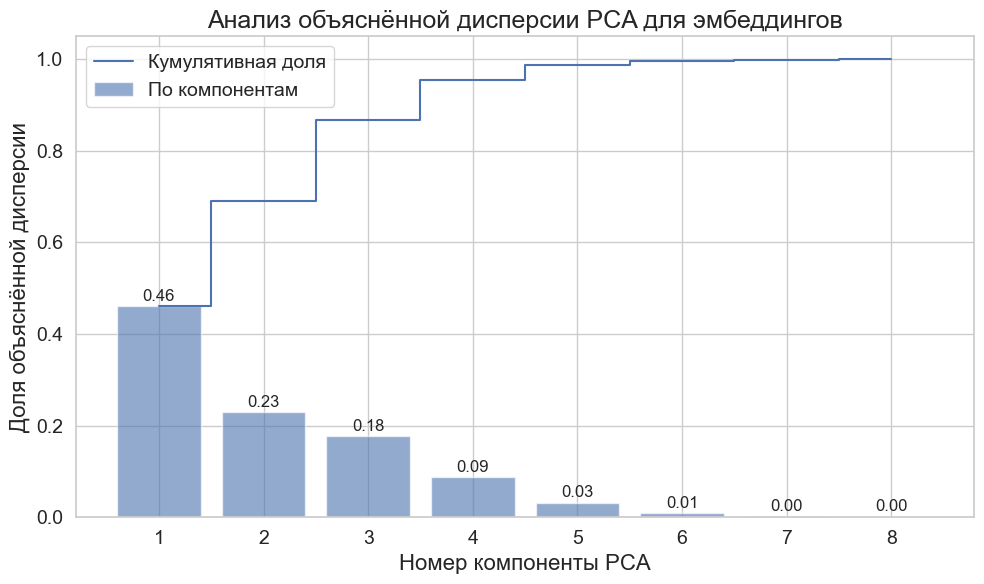

In [361]:
X = df.drop(['label'], axis=1).to_numpy()

pca = PCA(n_components=8)
pca.fit(X)

explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(10, 6))

# Построение столбцов
bars = plt.bar(range(1, 9), explained_variance_ratio, alpha=0.6, label='По компонентам')

# Подписи над столбцами
for i, v in enumerate(explained_variance_ratio):
    plt.text(i + 1, v + 0.005, f"{v:.2f}", ha='center', va='bottom', fontsize=12)

# Кумулятивная кривая
plt.step(range(1, 9), cumulative_variance, where='mid', label='Кумулятивная доля')

plt.xlabel('Номер компоненты PCA', fontsize=16)
plt.ylabel('Доля объяснённой дисперсии', fontsize=16)
plt.title('Анализ объяснённой дисперсии PCA для эмбеддингов', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.grid(True)

plt.tight_layout()
plt.show()

## 7.3 Интерпретация эмбеддингов

In [374]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

### Интерпретация эмбеддингов через логистическую регрессию с L1-регуляризацией

Ключевым фактором в решении задачи классификации жестов является способность модели **выделять характерные особенности движения**, такие как:
- тип жеста (взмах, поворот и т.д.),
- скорость и темп выполнения,
- пространственная траектория.

Если модель просто **запоминает положения рук из обучающей выборки**, она не сможет адекватно **обобщать** на новые жесты, вводимые пользователем.

Для оценки того, **какую информацию кодируют эмбеддинги**, важно понять, **какие признаки формируются внутри модели**. Один из подходов — использовать **логистическую регрессию с L1-регуляризацией**, которая способствует **разреженности весов**, зануляя наименее значимые коэффициенты. Это позволяет выявить те компоненты эмбеддинга, которые действительно **несут информацию**.

#### 🧪 Описание эксперимента:

- Пусть $x \in \mathbb{R}^{16}$ — вектор эмбеддинга.
- Формируем бинарную задачу: отличить **взмах** от других жестов.
    - Присваиваем метку $y = 1$, если жест — взмах;
    - Метку $y = 0$ — в остальных случаях.
- Обучаем **логистическую регрессию** с L1-регуляризацией:

$$
\hat{y} = \sigma(w^\top x + b), \quad \text{где } \sigma(z) = \frac{1}{1 + e^{-z}}
$$

- Функция потерь с регуляризацией:

$$
\mathcal{L}(w, b) = -\frac{1}{n} \sum_{i=1}^{n} \left[ y^{(i)} \log \hat{y}^{(i)} + (1 - y^{(i)}) \log(1 - \hat{y}^{(i)}) \right] + \lambda \|w\|_1
$$

- При достаточно **большом значении $\lambda$**, большинство весов обнуляются, остаются только те компоненты эмбеддинга, которые **значимы для классификации**.

#### 🧠 Интерпретация:

Таким образом, мы можем определить, **какой нейрон в эмбеддинге** (то есть какая координата $x_j$) несёт информацию о наличии взмаха.  
Это даёт возможность частично **интерпретировать обученную нейросеть**, а также **сократить размерность эмбеддингов**, оставив только информативные компоненты.


In [365]:
df_temp = df.copy()

In [367]:
df_temp

,0,1,2,3,4,5,6,7,label
0,1.973583,-0.912801,-0.957345,1.054387,0.883664,-0.106586,-0.873692,-0.359679,d_2lbm+
1,2.031682,-0.925653,-0.996099,1.124175,0.862244,-0.072461,-0.973680,-0.356090,d_2lbm+
2,2.014877,-0.920548,-0.980961,1.091802,0.858656,-0.064850,-0.961535,-0.345667,d_2lbm+
3,2.003350,-0.873479,-0.946355,1.062075,0.881240,-0.112662,-0.900325,-0.343595,d_2lbm+
4,1.933208,-0.877374,-0.887869,0.914603,0.830096,-0.039343,-0.838046,-0.326339,d_2lbm+
...,...,...,...,...,...,...,...,...,...
8667,-0.068255,-0.734815,-0.322468,-0.270876,1.353394,-0.799926,-0.172618,0.217631,s_pinch
8668,-0.194012,-0.921475,-0.288548,-0.275816,1.695974,-0.967579,-0.120718,0.067408,s_pinch
8669,-0.377224,-0.680912,-0.137967,-0.305147,1.010197,-0.686886,0.114811,-0.213616,s_pinch
8670,-0.354336,-0.785295,-0.168145,-0.249807,1.226945,-0.787605,0.107238,-0.248659,s_pinch


In [420]:
def is_swing(label):
    if label == 'd_right_swing' or label == 'd_left_swing':
        return 1
    else:
        return 0
df_temp['is_swing'] = df_temp['label'].apply(is_swing)
df_temp

,0,1,2,3,4,5,6,7,label,is_static,is_swing
0,1.973583,-0.912801,-0.957345,1.054387,0.883664,-0.106586,-0.873692,-0.359679,d_2lbm+,1,0
1,2.031682,-0.925653,-0.996099,1.124175,0.862244,-0.072461,-0.973680,-0.356090,d_2lbm+,1,0
2,2.014877,-0.920548,-0.980961,1.091802,0.858656,-0.064850,-0.961535,-0.345667,d_2lbm+,1,0
3,2.003350,-0.873479,-0.946355,1.062075,0.881240,-0.112662,-0.900325,-0.343595,d_2lbm+,1,0
4,1.933208,-0.877374,-0.887869,0.914603,0.830096,-0.039343,-0.838046,-0.326339,d_2lbm+,1,0
...,...,...,...,...,...,...,...,...,...,...,...
8667,-0.068255,-0.734815,-0.322468,-0.270876,1.353394,-0.799926,-0.172618,0.217631,s_pinch,0,0
8668,-0.194012,-0.921475,-0.288548,-0.275816,1.695974,-0.967579,-0.120718,0.067408,s_pinch,0,0
8669,-0.377224,-0.680912,-0.137967,-0.305147,1.010197,-0.686886,0.114811,-0.213616,s_pinch,0,0
8670,-0.354336,-0.785295,-0.168145,-0.249807,1.226945,-0.787605,0.107238,-0.248659,s_pinch,0,0


In [424]:
X = df_temp.drop(columns=['is_static', 'is_swing', 'label'])  # Убираем 'is_static' и 'labels'
y = df_temp['is_swing']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Применим Lasso для предсказания статичности жестов
lasso = Lasso(alpha=0.09)  # Параметр alpha регулирует силу регуляризации
lasso.fit(X_train, y_train)

# Предсказания
y_pred = lasso.predict(X_test)
y_pred = (y_pred > 0.7).astype(int)  # Преобразуем к бинарной классификации

# Оценка модели
print("Accuracy:", accuracy_score(y_test, y_pred))

# Посмотрим на коэффициенты
print("Coefficients for each feature:", lasso.coef_)

Accuracy: 0.8897002305918524
Coefficients for each feature: [ 0.         -0.03349588 -0.          0.         -0.          0.
 -0.         -0.        ]


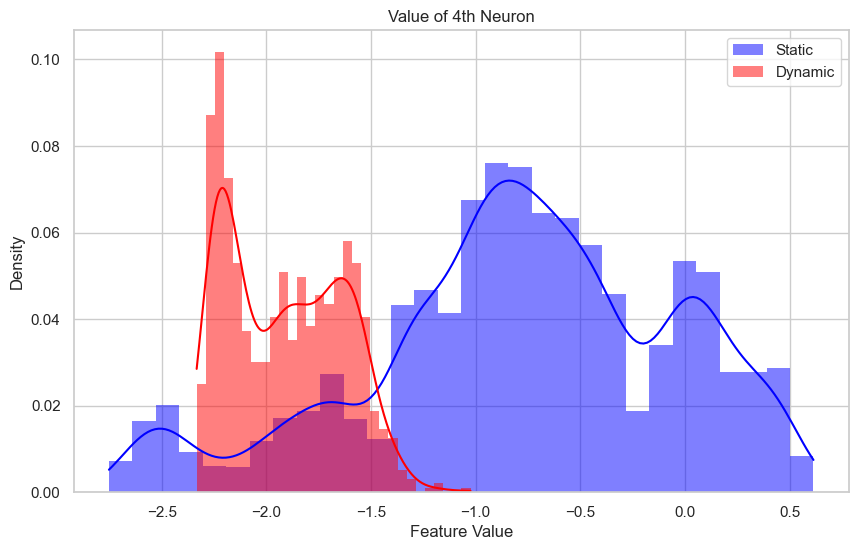

In [425]:
neg = df_temp[df_temp['is_swing'] == 0][1]
pos = df_temp[df_temp['is_swing'] == 1][1]

plt.figure(figsize=(10, 6))

# Гистограмма для статичных жестов
sns.histplot(neg, kde=True, color='blue', label='Static', bins=30, stat="probability", linewidth=0)

# Гистограмма для динамичных жестов
sns.histplot(pos, kde=True, color='red', label='Dynamic', bins=30, stat="probability", linewidth=0)

# Добавляем легенду и заголовок
plt.legend()
plt.title('Value of 4th Neuron')
plt.xlabel('Feature Value')
plt.ylabel('Density')

# Показываем график
plt.show()

Мы обнаружили, что существует отдельный нейрон в эмбеддинге, на основе которого можно построить классификатор жеста "взмах" с точностью

$$
\textbf{Accuracy} = 0.8897
$$

Это означает, что один компонент эмбеддинга содержит достаточно информации для эффективного различения взмахов и других жестов.

Таким образом, наш подход позволяет не только интерпретировать, какие признаки выделяет модель, но и снижать размерность признакового пространства, оставляя только информативные нейроны.


# 8. Тест эмбеддингов для классификации

In [432]:
ds_train = GestureDataset('GestureData', transform=PrepateData(), return_unk=True)
print(f"Элементов в обучающей выборке: {len(ds_train)}")

embeddings_list = []
labels_list = []
model.to(device)
with torch.no_grad():
    for gesture, _, _ in tqdm(ds_train, desc="Computing embeddings"):
        label = gesture[0]               # метка
        data_tensor = gesture[1].unsqueeze(0).to(device)  # вход, batch dim, на устройство

        emb = model(data_tensor)         # (1, embedding_size)
        emb = emb.squeeze(0).cpu().numpy()  # убрать batch dim, в numpy

        embeddings_list.append(emb)
        labels_list.append(label)

df_train = pd.DataFrame(embeddings_list)
df_train['label'] = labels_list

Элементов в обучающей выборке: 9074


Computing embeddings: 100%|████████████████████████████████████████████████████████| 9074/9074 [01:57<00:00, 77.22it/s]


In [433]:
ds_test = GestureDataset('GestureDataTest', transform=PrepateData(), return_unk=True)
print(f"Элементов в обучающей выборке: {len(ds_test)}")

embeddings_list = []
labels_list = []

with torch.no_grad():
    for gesture, _, _ in tqdm(ds_test, desc="Computing embeddings"):
        label = gesture[0]               # метка
        data_tensor = gesture[1].unsqueeze(0).to(device)  # вход, batch dim, на устройство

        emb = model(data_tensor)         # (1, embedding_size)
        emb = emb.squeeze(0).cpu().numpy()  # убрать batch dim, в numpy

        embeddings_list.append(emb)
        labels_list.append(label)

df_test = pd.DataFrame(embeddings_list)
df_test['label'] = labels_list

Элементов в обучающей выборке: 960


Computing embeddings: 100%|██████████████████████████████████████████████████████████| 960/960 [00:20<00:00, 45.96it/s]


In [454]:
df_train_dyn = df_train[df_train['label'].str.startswith('d_')]
df_test_dyn = df_test[df_test['label'].str.startswith('d_')]

df_train_stat = df_train[df_train['label'].str.startswith('s_')]
df_test_stat = df_test[df_test['label'].str.startswith('s_')]

df_train_unk = df_train[df_train['label'].str.startswith('unk_')]
df_test_unk = df_test[df_test['label'].str.startswith('unk_')]

### 8.1 Классификация динамичных жестов

In [447]:
# Разделяем признаки и метки
X_train = df_train_dyn.drop(columns=['label'])
y_train = df_train_dyn['label']

X_test = df_test_dyn.drop(columns=['label'])
y_test = df_test_dyn['label']

# Создаем и обучаем KNN классификатор
knn = KNeighborsClassifier(n_neighbors=5)  # 5 соседей, можно менять
knn.fit(X_train, y_train)

# Предсказание на тесте
y_pred = knn.predict(X_test)

# Оценка качества
accuracy = accuracy_score(y_test, y_pred)
print(f"KNN accuracy: {accuracy:.4f}")

KNN accuracy: 0.9778


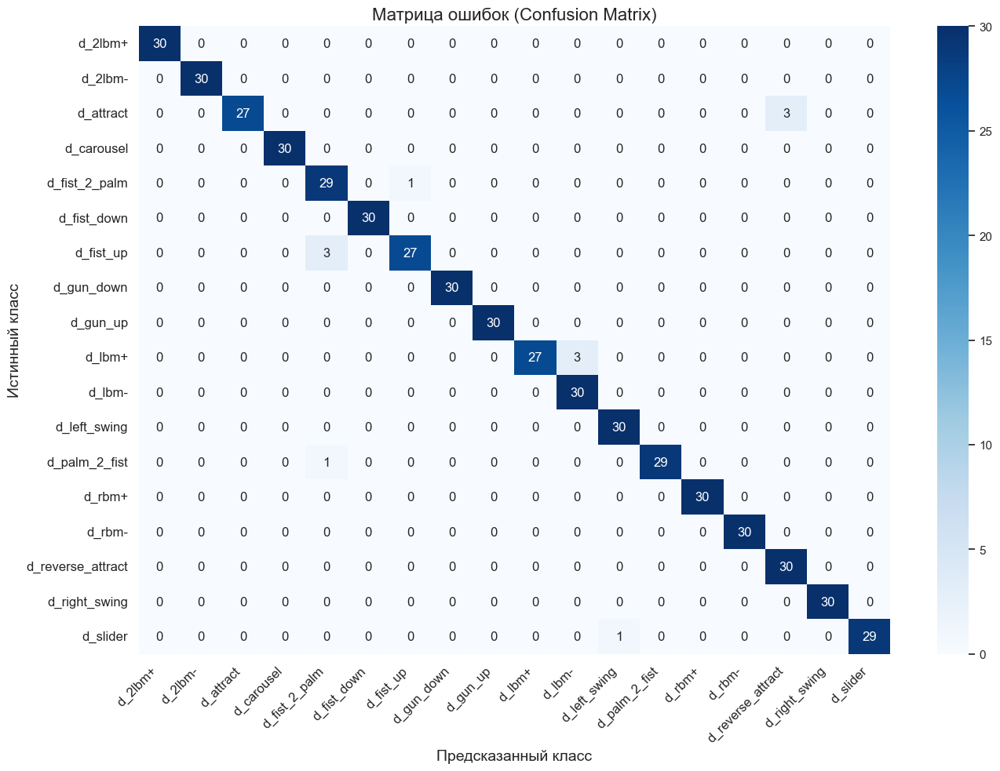

In [449]:
cm = confusion_matrix(y_test, y_pred, labels=knn.classes_)

plt.figure(figsize=(14, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=knn.classes_, yticklabels=knn.classes_)

plt.xlabel('Предсказанный класс', fontsize=14)
plt.ylabel('Истинный класс', fontsize=14)
plt.title('Матрица ошибок (Confusion Matrix)', fontsize=16)

# Поворот подписей по оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

### 8.2 Классификация статичных жестов

In [450]:
# Разделяем признаки и метки
X_train = df_train_stat.drop(columns=['label'])
y_train = df_train_stat['label']

X_test = df_test_stat.drop(columns=['label'])
y_test = df_test_stat['label']

# Создаем и обучаем KNN классификатор
knn_stat = KNeighborsClassifier(n_neighbors=5)  # 5 соседей, можно менять
knn_stat.fit(X_train, y_train)

# Предсказание на тесте
y_pred = knn_stat.predict(X_test)

# Оценка качества
accuracy = accuracy_score(y_test, y_pred)
print(f"KNN accuracy: {accuracy:.4f}")

KNN accuracy: 0.8200


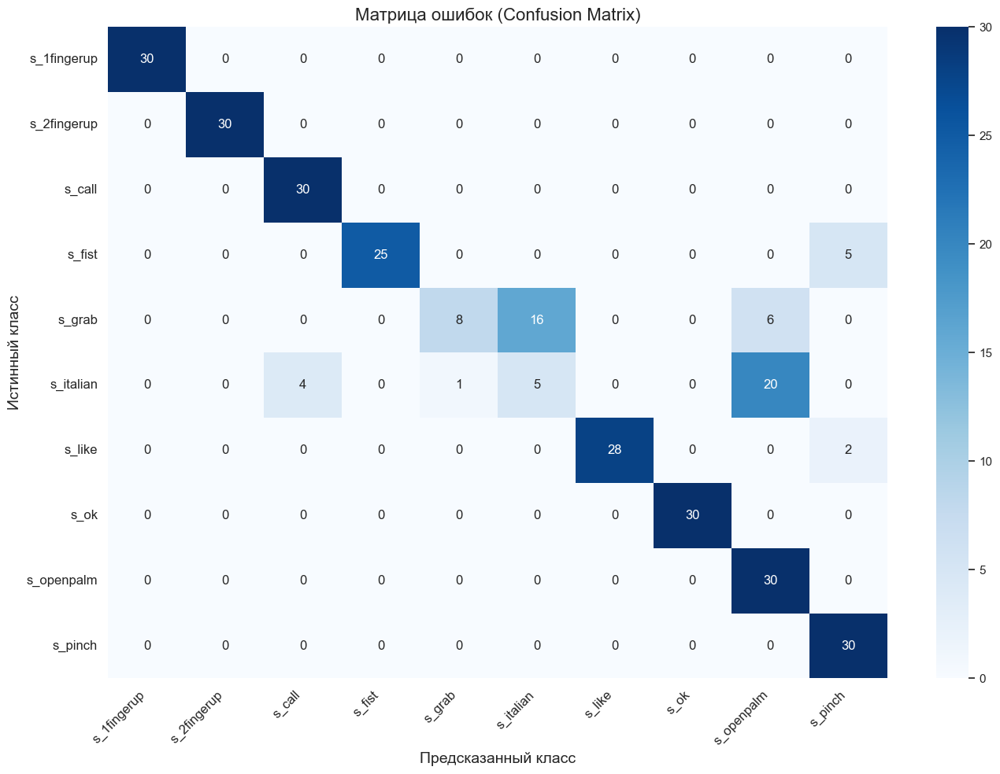

In [453]:
cm = confusion_matrix(y_test, y_pred, labels=knn_stat.classes_)

plt.figure(figsize=(14, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=knn_stat.classes_, yticklabels=knn_stat.classes_)

plt.xlabel('Предсказанный класс', fontsize=14)
plt.ylabel('Истинный класс', fontsize=14)
plt.title('Матрица ошибок (Confusion Matrix)', fontsize=16)

# Поворот подписей по оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

### 8.3 Классификация только новых жестов

In [458]:
# Разделяем признаки и метки
X_train = df_train_unk.drop(columns=['label'])
y_train = df_train_unk['label']

X_test = df_test_unk.drop(columns=['label'])
y_test = df_test_unk['label']

# Создаем и обучаем KNN классификатор
knn_unk = KNeighborsClassifier(n_neighbors=5)  # 5 соседей, можно менять
knn_unk.fit(X_train, y_train)

# Предсказание на тесте
y_pred = knn_unk.predict(X_test)

# Оценка качества
accuracy = accuracy_score(y_test, y_pred)
print(f"KNN accuracy: {accuracy:.4f}")

KNN accuracy: 0.9667


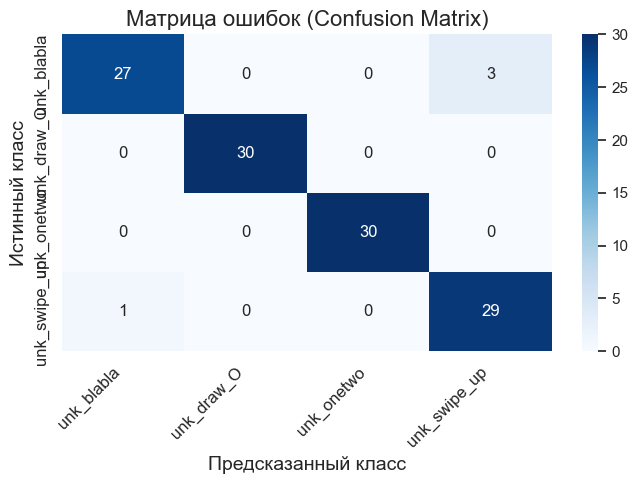

In [460]:
cm = confusion_matrix(y_test, y_pred, labels=knn_unk.classes_)

plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=knn_unk.classes_, yticklabels=knn_unk.classes_)

plt.xlabel('Предсказанный класс', fontsize=14)
plt.ylabel('Истинный класс', fontsize=14)
plt.title('Матрица ошибок (Confusion Matrix)', fontsize=16)

# Поворот подписей по оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

### 8.4 Добавление новых жестов в систему

In [461]:
df_train_uni = pd.concat([df_train_dyn, df_train_unk], ignore_index=True)
df_test_uni = pd.concat([df_test_dyn, df_test_unk], ignore_index=True)

In [462]:
# Разделяем признаки и метки
X_train = df_train_uni.drop(columns=['label'])
y_train = df_train_uni['label']

X_test = df_test_uni.drop(columns=['label'])
y_test = df_test_uni['label']

# Создаем и обучаем KNN классификатор
knn_uni = KNeighborsClassifier(n_neighbors=5)  # 5 соседей, можно менять
knn_uni.fit(X_train, y_train)

# Предсказание на тесте
y_pred = knn_uni.predict(X_test)

# Оценка качества
accuracy = accuracy_score(y_test, y_pred)
print(f"KNN accuracy: {accuracy:.4f}")

KNN accuracy: 0.9409


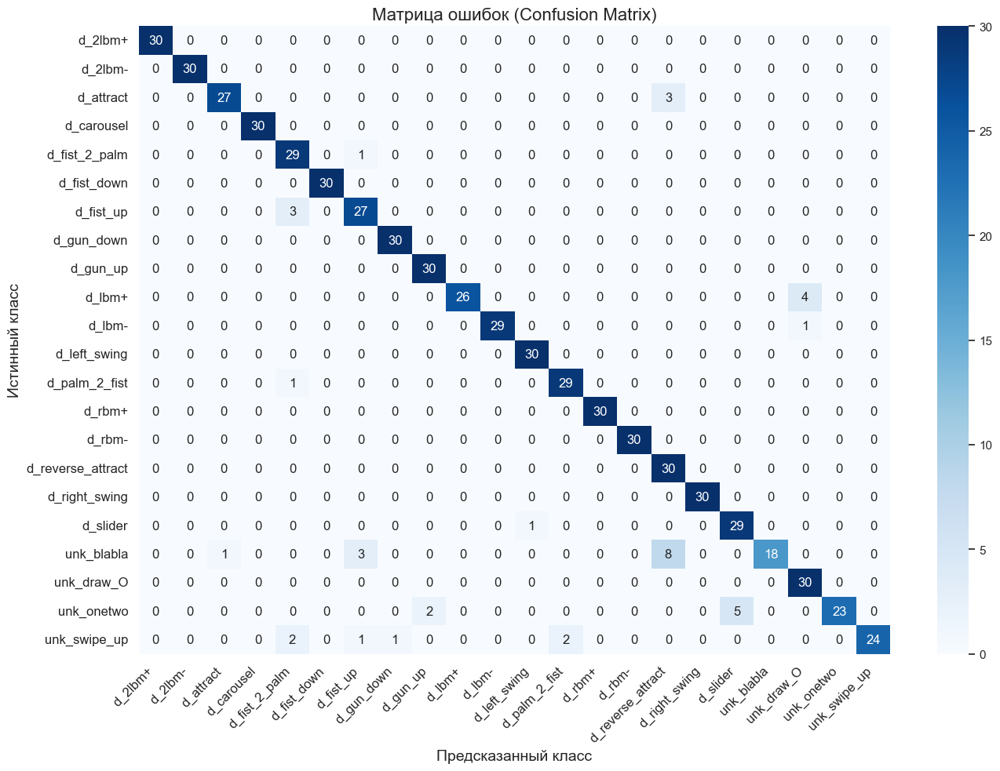

In [465]:
cm = confusion_matrix(y_test, y_pred, labels=knn_uni.classes_)

plt.figure(figsize=(14, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=knn_uni.classes_, yticklabels=knn_uni.classes_)

plt.xlabel('Предсказанный класс', fontsize=14)
plt.ylabel('Истинный класс', fontsize=14)
plt.title('Матрица ошибок (Confusion Matrix)', fontsize=16)

# Поворот подписей по оси X для лучшей читаемости
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

### ✅ Заключение

В рамках работы была обучена **модель-энкодер**, преобразующая исходные данные (жесты) в **векторные представления (эмбеддинги)**.  
Полученные эмбеддинги обладают **информативной структурой** — на их основе возможно построение:

- **Интерпретируемых линейных моделей**, таких как логистическая регрессия с L1-регуляризацией;
- **Нелинейных классификаторов**, включая KNN;
- **Системы распознавания жестов**, способной различать динамические и статические движения.

Эксперименты показали, что даже **по отдельным компонентам эмбеддингов** можно добиться высокой точности.  
Таким образом, эмбеддинги действительно **кодируют ключевую информацию о типе жеста**, и могут служить основой для построения более сложных распознавателей.
